# Model Explorations

- Unsupervized models: Nearest Niehgbors

In [1]:
import os
import sys

import seaborn as sns
import pandas as pd
import numpy as np
from joblib import dump, load
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
from sklearn.neighbors import KDTree
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv('/Users/flanuer/Downloads/Lambda/Course_material/misc_datasets/non_dup_200k_song_aud_feat.csv')
drop_col = ['Unnamed: 0']
df = df.drop(drop_col, axis=1)

In [3]:
df.head(3)

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,id,duration_ms,time_signature
0,0.746,0.765,6,-4.410,0,0.0993,0.0112,0.0,0.0936,0.737,114.044,0v1x6rN6JHRapa03JElljE,199054,4
1,0.935,0.454,1,-7.509,1,0.3750,0.0194,0.0,0.0824,0.357,133.073,4Oun2ylbjFKMPTiaSbbCih,187541,4
2,0.548,0.816,0,-4.209,1,0.0465,0.1220,0.0,0.3350,0.557,95.390,6UelLqGlWMcVH1E5c4H7lY,174000,4


In [4]:
df.describe(percentiles=[.25, .5, .75, .9, .95])

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
count,210124.000000,210124.000000,210124.000000,210124.000000,210124.000000,210124.000000,210124.000000,210124.000000,210124.000000,210124.000000,210124.000000,2.101240e+05,210124.000000
mean,0.567127,0.550861,5.243942,-10.453061,0.627225,0.127020,0.367884,0.211113,0.194406,0.434407,118.455018,2.315242e+05,3.858212
std,0.189523,0.275391,3.590865,6.846359,0.483544,0.180621,0.357377,0.351130,0.167107,0.257878,30.919423,1.793759e+05,0.562426
min,0.000000,0.000000,0.000000,-60.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.203000e+03,0.000000
25%,0.447000,0.342000,2.000000,-12.904000,0.000000,0.037800,0.032700,0.000000,0.097400,0.221000,95.038000,1.700645e+05,4.000000
50%,0.591000,0.585000,5.000000,-8.262000,1.000000,0.053100,0.232000,0.000192,0.124000,0.413000,119.960000,2.077260e+05,4.000000
75%,0.708000,0.777000,8.000000,-5.748000,1.000000,0.120000,0.713000,0.327000,0.237000,0.631000,138.001000,2.517600e+05,4.000000
90%,0.797000,0.901000,10.000000,-4.223000,1.000000,0.317000,0.944000,0.887000,0.383000,0.808000,160.034000,3.238270e+05,4.000000
95%,0.840000,0.946000,11.000000,-3.459000,1.000000,0.475000,0.983000,0.926000,0.573000,0.890000,173.489250,4.100930e+05,4.000000
max,0.996000,1.000000,11.000000,1.806000,1.000000,0.969000,0.996000,1.000000,0.999000,1.000000,249.983000,5.925082e+06,5.000000


In [5]:
def reduce_mem_usage(df, verbose=True):
    """ Function iterates through all the columns of a dataframe and modify the data type
        to reduce memory usage.
        Credit to: https://www.kaggle.com/gemartin/load-data-reduce-memory-usage
        Parameters
        ----------
        df : Pandas DataFrame
        verbose: (True) by default, prints out before and after memory usage
        Returns
        -------
        df : Reduced Memory Pandas DataFrame
    """

    if verbose:
        start_mem = df.memory_usage().sum() / 1024**2
        print('Memory usage of dataframe is {:.2f} MB'.format(start_mem))

    for col in df.columns:
        col_type = df[col].dtype

        if col_type != object:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
    if verbose:
        end_mem = df.memory_usage().sum() / 1024**2
        print('Memory usage after optimization is: {:.2f} MB'.format(end_mem))
        print('Decreased by {:.1f}%'.format(
            100 * (start_mem - end_mem) / start_mem))

    return df

In [6]:
df = reduce_mem_usage(df)

Memory usage of dataframe is 22.44 MB
Memory usage after optimization is: 6.61 MB
Decreased by 70.5%


In [7]:
# Remove speechiness values < .32; over 90% of all values lie below this threshold
df = df[df['speechiness'] < .32]

In [8]:
profile = ProfileReport(df, title='Pandas Profiling Report')

In [13]:
profile.to_notebook_iframe()

### Nearest Neighbors

In [15]:
target = df['id']
features = ['danceability',
            'energy',
            'key',
            'loudness',
            'mode',
            'speechiness',
            'acousticness',
            'instrumentalness',
            'liveness',
            'valence',
            'tempo',
            'duration_ms',
            'time_signature']
y = target
X = df[features]

In [16]:
# query model for nearest neighbors

tree = KDTree(X)

song_nums = 10
dist, indxs = tree.query(X, k=song_nums+1)

In [17]:
# Create column names first
column_names = ['Searched_Song']
for i in range(1, song_nums+1):
    column_names.append(f'Nearest_Song{i}')
    
# Calculate scores from distances
scores = (1 - ((dist - dist.min()) / (dist.max() - dist.min()))) * 100
dist_df = pd.DataFrame(scores.tolist(), columns=column_names)

# Limit decimal place output to 1
dist_df = dist_df.round(decimals=1)

# Replace Searched Song score with the track_id
dist_df['Searched_Song'] = df.id

# Drops NA values
dist_df.isna().any()

# Checks for NA vals
dist_df = dist_df.dropna()

In [18]:
# Making an array of the Track IDs
track_ids = np.array(df.id)

# A function that creates list of the each song with its nearest neighbors
def find_similars(track_ids, indxs):
    """For each track in the dataset find similar songs"""
    similars = []
    for row in indxs:
        ids = [track_ids[i] for i in row]
        similars.append(ids)
    return similars

# The first item in each row is a song in the original database.  
# The next 10 rows are its closest neighbors in the KDTree.
nearest_neighbors = find_similars(track_ids, indxs)

# Convert it to dataframe
nearest_neighbors_df = pd.DataFrame(nearest_neighbors, columns=column_names)
nearest_neighbors_df = nearest_neighbors_df.drop_duplicates(inplace=False, subset=['Searched_Song'], keep='first')
nearest_neighbors_df.head()

,Searched_Song,Nearest_Song1,Nearest_Song2,Nearest_Song3,Nearest_Song4,Nearest_Song5,Nearest_Song6,Nearest_Song7,Nearest_Song8,Nearest_Song9,Nearest_Song10
0,0v1x6rN6JHRapa03JElljE,0Zp9nCq2j9AXJoZ6mn3kzF,1rf25spF3JfPs16i0UkvHM,69jAWn8c3I81SHphhF6zHj,0LeuWbFlcDkgs2qJ2oigCR,02Zyq2BvzAHvo826kuzuet,5PM2egIBbhwIkVxowdHGlo,5hrbuCjGxws7txUEr8XDgb,2FqevXNVpzGd1jDhto40vC,3cKCgr7F2oP8NFGFrc210g,35V6qXUDCvwZdmbKe5PlPG
1,6UelLqGlWMcVH1E5c4H7lY,1e9oZCCiX42nJl0AcqriVo,0pKP70i4spmcpIW30HedEl,6AooRgSRDzbCYL4NZ4RCjU,42qYYhJh2NyvpWbPResVpi,5JNgFY6PzXZ5n5N2MFfeRQ,6fxlcTylxj06V5MRoCdtKP,5RApJB3xWzniVnHtQDAaCP,0qyFaDzQVEsI4sxRddiAv6,5PnDkoaBc4oUFguDlAZmJJ,1rjUBUTswCkN8DIBxkgjJs
2,7ytR5pFWmSjzHJIeQkgog4,2mLIgsVerKCUjzzdgUJLop,0VtVoSovIZ80g7fDRzMBGE,5F6x5MH7s8nG3Cd2Y4WZgo,2ZWmWGoZS2OTGZSnMhck7Q,6dIpoQIqZM4zpJ5h3ds2ie,0VlolThdHeqURFTDnJlH2C,4nJ5svbzhdgyillgqnxne1,2YCieDJDzJoYMd7IsbyHGW,3PlU3SLhlh69soF1kzQWDk,6xV8Ko71oo0RPQFrL2ZpUf
3,2SAqBLGA283SUiwJ3xOUVI,78WDQpXxWN1UE1d7oZlE0C,6xtjSYzZPJCTzC70x30Tr4,2tHYJ6y9DwvKaW17hSnzkd,6HnBFWbP9LMjMQbjHHWrTg,5X3WzIcUcyT243if4gmXo8,6hCIz4FCPxb9g7v3Cweyp9,2hVQh6Yq26Qjk8tEp484Vb,4fEhBACUCDbawqAYFBmTY4,1Rk8MRTsBiUod0kYrWsl65,4feXJ5IC3avXsVW9WNFSag
4,3H7ihDc1dqLriiWXwsc2po,3WSRHoXYbNzUQA9vxQ3FlA,0Cf8Juik1Rp1J7iFqxTUGK,3QhYLAJdteWQAFeYK1PbGc,17Pnjtj0ogDVPQFezBpIwN,7LAHFWFIjOp6jOr57ym1PP,1McVXTjFqh7g8V8OB7jU2i,44Hc1wQUi3wTF2hL7E9nml,1f5ZGUtK2W9V7kYpaE5r8T,4NfNmtFPQwR7IYoKeBErOp,2tojlazYT3f5mAqXgGDuy5


In [19]:
nearest_neighbors_df.shape

(186123, 11)

In [47]:
# Exporting dataframe of +100k songs to csv file
# nearest_neighbors_df.to_csv(r'/Users/flanuer/Downloads/Lambda/Course_material/misc_datasets/kdtree_suggestions.csv')

# Model: Nearest

In [20]:
from sklearn import metrics
import matplotlib.pyplot as plt
from sklearn import preprocessing
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer
from sklearn.pipeline import make_pipeline
from sklearn.metrics import silhouette_score
from sklearn.neighbors import NearestNeighbors
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler, MinMaxScaler, Normalizer, LabelEncoder

In [23]:
scaled_data = StandardScaler().fit_transform(X.T)
scaled_data.shape

(13, 189334)

In [24]:
pca = PCA()
pca.fit(scaled_data)
pca_data = pca.transform(scaled_data)

In [46]:
sum_of_sqrd_sit = []
K = range(1, 13)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(scaled_data)
    sum_of_sqrd_sit.append(km.inertia_)

In [49]:
for n_clusters in range(2,13):
    clusterer = KMeans (n_clusters=n_clusters)
    preds = clusterer.fit_predict(scaled_data)
    centers = clusterer.cluster_centers_
    score = silhouette_score(scaled_data, preds, metric='euclidean')
    print("For n_clusters = {}, silhouette score is {})".format(n_clusters, score))

For n_clusters = 2, silhouette score is 0.2502480228063674)
For n_clusters = 3, silhouette score is 0.13060530189748953)
For n_clusters = 4, silhouette score is 0.1325461474488194)
For n_clusters = 5, silhouette score is 0.1359118734667417)
For n_clusters = 6, silhouette score is 0.12444420017551323)
For n_clusters = 7, silhouette score is 0.13426252613528183)
For n_clusters = 8, silhouette score is 0.11815946942005193)
For n_clusters = 9, silhouette score is 0.13678859248122407)
For n_clusters = 10, silhouette score is 0.1198881155833032)
For n_clusters = 11, silhouette score is 0.12086360128462939)
For n_clusters = 12, silhouette score is 0.11266760488354186)


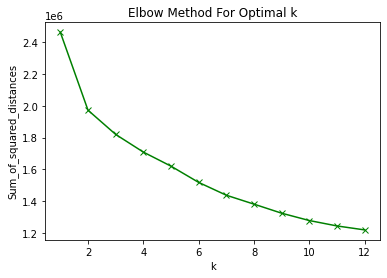

In [50]:
plt.plot(K, sum_of_sqrd_sit, 'gx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [51]:
kmeans = KMeans(n_clusters=4)
kmeans.fit(scaled_data)

KMeans(n_clusters=4)

In [53]:
y_kmeans = kmeans.predict(scaled_data)
pca = PCA(n_components=2)
principal_components = pca.fit_transform(scaled_data)

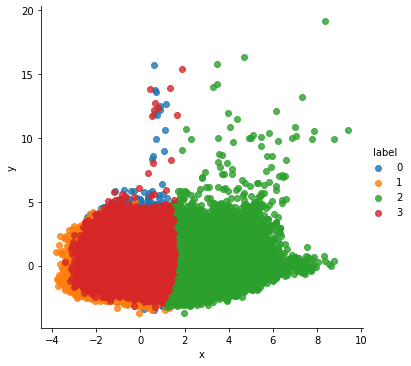

In [57]:
pc = pd.DataFrame(principal_components)
pc['label'] = y_kmeans
pc.columns = ['x', 'y', 'label']

cluster = sns.lmplot(data=pc, x='x', y='y', hue='label', fit_reg=False, legend=True, legend_out=True)

In [61]:
tsne = TSNE(n_components=2, perplexity=50)
tsne_components = tsne.fit_transform(scaled_data)

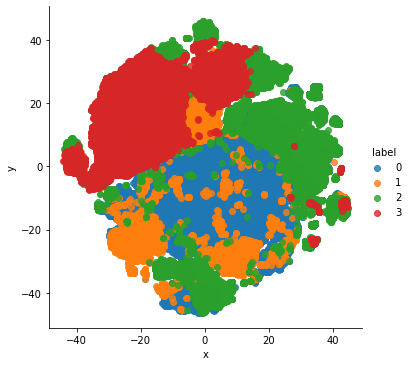

In [62]:
ts = pd.DataFrame(tsne_components)
ts['label'] = y_kmeans
ts.columns = ['x', 'y','label']

#plot data with seaborn
cluster = sns.lmplot(data=ts, x='x', y='y', hue='label', 
                   fit_reg=False, legend=True, legend_out=True)

In [63]:
pca.explained_variance_ratio_

array([0.27360079, 0.09779409])

In [66]:
pca_comps = pd.DataFrame(pca.components_, columns=X.columns, index=['PC-1','PC-2'])
pca_comps

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
PC-1,-0.339437,-0.447773,-0.029588,-0.460749,0.046798,-0.196276,0.412344,0.297362,-0.077955,-0.303721,-0.188591,0.082706,-0.176695
PC-2,-0.457675,0.286734,0.014307,0.113857,-0.048814,-0.103692,-0.256776,0.080258,0.525055,-0.392302,0.163989,0.386743,-0.059936


In [69]:
df['label'] = y_kmeans

# shuffle dataset

df = df.sample(frac=1)
df['label'].value_counts()

0    78108
3    48093
2    41145
1    21988
Name: label, dtype: int64

In [83]:
df[df['label'] == 0].tail(50)

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,label
id,,,,,,,,,,,,,,
2fjFyXkw6aEfGezJl2MGLG,0.710938,0.811035,6,-6.929688,1,0.033203,0.155029,0.000002,0.094910,0.504883,111.9375,237480,4,0
0RUGuh2uSNFJpGMSsD1F5C,0.576172,0.834961,2,-6.824219,1,0.048615,0.336914,0.000000,0.081970,0.476074,150.0000,257720,4,0
73gx888k1raTwjFeuqIV5D,0.571777,0.357910,7,-10.171875,1,0.029205,0.406982,0.005730,0.122009,0.405029,77.2500,236664,4,0
3EVJZzVqowaUpKdyo7SIdw,0.814941,0.281006,9,-13.078125,1,0.106018,0.145996,0.000005,0.093811,0.323975,97.0000,155876,4,0
4AQ0FuLnPIM4rDKH4VleLD,0.472900,0.874023,2,-2.398438,1,0.044586,0.009422,0.000000,0.209961,0.738770,150.2500,176307,4,0
68E4yvbGQXVOlyrYSF5x2j,0.480957,0.873047,8,-6.031250,1,0.051392,0.001590,0.000059,0.361084,0.402100,146.5000,160000,4,0
1D5EXAiJbsw08mRKFGW2xO,0.639160,0.549805,7,-7.355469,1,0.026993,0.244995,0.000002,0.176025,0.659180,109.6875,193445,4,0
25vkCIiNplwjClCSw76ExG,0.542969,0.916992,7,-5.296875,1,0.053406,0.075928,0.000000,0.104980,0.392090,86.9375,202591,4,0
2IelzQCLKetKXGmnXxP3S1,0.654785,0.913086,1,-6.441406,1,0.083984,0.011101,0.916016,0.423096,0.745117,132.7500,352467,4,0


In [84]:
df[df['label'] == 1].tail(50)

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,label
id,,,,,,,,,,,,,,
7r3KzVwHtr2iMZtqJvFn9A,0.666016,0.735840,8,-8.171875,0,0.192993,0.135010,0.000000,0.203003,0.766113,93.1875,282040,4,1
3YbF8ywOvj9lXSZJ4ggdfL,0.787109,0.712891,5,-3.464844,1,0.161987,0.352051,0.000000,0.081909,0.410889,100.0000,180402,4,1
3cQCiT1PvddSKI8pRk4ygK,0.755859,0.675781,6,-7.835938,1,0.224976,0.219971,0.000000,0.223999,0.684082,131.2500,172225,4,1
319COjxI2H7lyDoPuZA8St,0.923828,0.455078,11,-8.484375,0,0.182983,0.003679,0.001290,0.071472,0.619141,141.0000,267348,4,1
4V7rpkEn89x50Y2Go1fRDe,0.365967,0.605957,5,-14.906250,1,0.240967,0.683105,0.000005,0.140015,0.309082,132.6250,47292,5,1
43THyrphAhAoeR5HEarSVn,0.750977,0.801758,7,-3.205078,1,0.166016,0.145996,0.000000,0.106995,0.608887,92.8125,206227,4,1
5OLVDfDtBQj4geZCvRmQGk,0.548828,0.919922,7,-4.722656,1,0.301025,0.001961,0.000066,0.487061,0.621094,128.0000,207507,4,1
4tOmFSoQA9ji8lTxAbbvq1,0.503906,0.493896,5,-7.621094,0,0.283936,0.402100,0.000002,0.366943,0.425049,69.3125,229773,4,1
3R0cSXhkXUxi6N2GcCdUOT,0.754883,0.747070,8,-4.355469,0,0.290039,0.001170,0.000000,0.068176,0.281982,86.9375,260937,4,1


In [85]:
df[df['label'] == 2].tail(50)

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,label
id,,,,,,,,,,,,,,
5XxByYjKDTU4zGSY7FH77G,0.161011,0.375977,7,-12.156250,1,0.035797,0.795898,0.949219,0.109009,0.073486,164.1250,156947,4,2
5H4XMIorgnOoTrQ2JLPvEl,0.615234,0.061707,2,-15.093750,1,0.036011,0.937012,0.000197,0.103027,0.374023,124.3750,182063,4,2
5IFnnmGSABqC1hlFaxNngO,0.450928,0.001640,1,-34.593750,1,0.064819,0.987793,0.651855,0.091125,0.053314,137.2500,421987,3,2
3KauESIxzjW4ylJfCxlM4F,0.334961,0.097412,8,-18.578125,1,0.055115,0.979980,0.916016,0.109985,0.065613,166.3750,180948,3,2
7bOy53RBWi5dvaXTlUvYHF,0.151001,0.068909,1,-22.000000,1,0.049408,0.909180,0.072510,0.246948,0.039886,71.8750,891760,3,2
4MxQUIX2RwrJ1ktT3Y3Esi,0.509766,0.290039,0,-14.789062,1,0.029404,0.723145,0.385986,0.104980,0.435059,130.8750,231067,4,2
4sfN7Ru8MCQu5xnj4sxyoi,0.515137,0.343018,8,-17.703125,0,0.039001,0.868164,0.703125,0.039703,0.668945,112.8125,394800,4,2
7BjrGth5NDshMjjxpSJesq,0.615234,0.111023,7,-18.546875,0,0.041199,0.872070,0.008240,0.183960,0.104004,82.9375,198072,4,2
1PGt1IZdXAQXa8pmgM5EFl,0.208008,0.055603,2,-27.578125,1,0.037109,0.865234,0.973145,0.119995,0.227051,69.2500,114920,4,2


In [86]:
df[df['label'] == 3].tail(50)

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,label
id,,,,,,,,,,,,,,
1s9ZzN48ASRHfMMEtOAjf1,0.857910,0.786133,9,-8.523438,0,0.054901,0.087524,0.230957,0.104004,0.840820,102.0000,204083,3,3
6354F1jJ0ypQASL5Ivwnzp,0.479004,0.659180,1,-6.218750,0,0.032806,0.192993,0.000000,0.302979,0.777832,114.0625,180320,4,3
4KudM1XwC6yLxdxy3O5JOf,0.592773,0.943848,2,-4.281250,0,0.049194,0.003531,0.000306,0.193970,0.519043,105.0625,222075,4,3
0RfbglkqGj210w0KjGbvW9,0.728027,0.537109,4,-13.125000,0,0.070129,0.829102,0.942871,0.109985,0.537109,130.0000,146887,4,3
66ZjMwvdoLjhWj0pYwNF3R,0.884766,0.812012,4,-2.742188,0,0.054199,0.320068,0.000009,0.090027,0.967773,114.0000,203677,4,3
16PYMFaCFpjKKF4BCt6f8g,0.312988,0.775879,11,-4.328125,0,0.068420,0.171997,0.000003,0.119019,0.313965,73.8750,183989,4,3
4LSZ32eiLhVlzhmKDQBRqA,0.795898,0.647949,10,-5.222656,0,0.062103,0.303955,0.000000,0.128052,0.715820,97.4375,188923,4,3
5N9TMHisRIRSwd8U9uE5lx,0.744141,0.706055,6,-5.675781,0,0.077026,0.022598,0.000002,0.135010,0.520996,108.0625,224840,4,3
1ntt1IG6hWCd44vpWna8jf,0.799805,0.524902,6,-10.390625,0,0.046204,0.004810,0.850098,0.126953,0.472900,125.0000,375963,4,3
